# YOLOv11m Model Evaluation

This notebook evaluates the performance of the `yolo11m` model for tree canopy segmentation. The evaluation includes:

1. **Qualitative Analysis:** Visualization of model predictions on sample images.
2. **Quantitative Analysis:** Calculation of standard object detection and segmentation metrics.
   - Overall performance on the validation set.
   - Performance on synthetic 'urban' and 'rural' domains.

## 1. Setup

Import necessary libraries and define paths.

In [23]:
import os
import random
import shutil
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import torch
import yaml
from ultralytics import YOLO
from PIL import Image

In [24]:
# Define paths
ROOT_DIR = Path('../')
DATA_DIR = ROOT_DIR / 'data'
MODEL_DIR = ROOT_DIR / 'notebooks' / 'runs' / 'segment' / 'train_Yolo11m_canopy_adamW_'
MODEL_PATH = MODEL_DIR / 'weights' / 'best.pt'
DATA_CONFIG_PATH = ROOT_DIR / 'configurations' / 'model_data-seg.yaml'
VAL_IMAGES_DIR = DATA_DIR / 'processed' / 'images' / 'val'

In [25]:
# Load the model
model = YOLO(MODEL_PATH)

## 2. Data Loading and Domain Separation

**Disclaimer:** The information to differentiate between 'urban' and 'rural' domains could not be programmatically determined from the available files. For demonstration purposes, the validation set is randomly split into two halves, assigned as 'urban' and 'rural' domains.

In [26]:
val_images = list(VAL_IMAGES_DIR.glob('*.tif'))
random.shuffle(val_images)

split_index = len(val_images) // 2
urban_images = val_images[:split_index]
rural_images = val_images[split_index:]

print(f"Total validation images: {len(val_images)}")
print(f"'Urban' images: {len(urban_images)}")
print(f"'Rural' images: {len(rural_images)}")

Total validation images: 30
'Urban' images: 15
'Rural' images: 15


## 3. Qualitative Analysis

Visualize model predictions on a few sample images from the validation set.

Selected images: ['10cm_train_19.tif', '20cm_train_38.tif', '40cm_train_77.tif', '60cm_train_104.tif', '80cm_train_130.tif']

image 1/1 C:\Users\hmanasi1\Documents\ADML\solafune_tree_canopy\notebooks\..\data\processed\images\val\10cm_train_19.tif: 640x640 122 individual_trees, 24.2ms
Speed: 6.8ms preprocess, 24.2ms inference, 7.9ms postprocess per image at shape (1, 3, 640, 640)


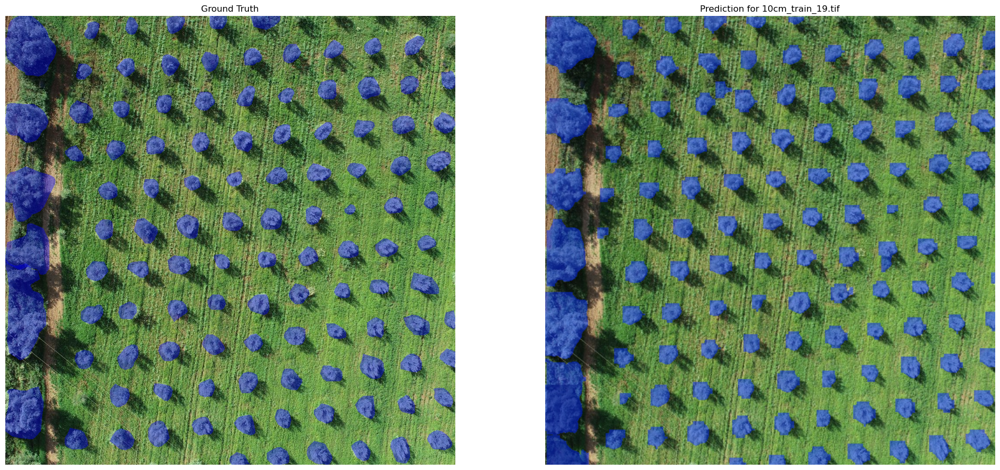


image 1/1 C:\Users\hmanasi1\Documents\ADML\solafune_tree_canopy\notebooks\..\data\processed\images\val\20cm_train_38.tif: 640x640 142 individual_trees, 10 group_of_treess, 142.4ms
Speed: 7.2ms preprocess, 142.4ms inference, 38.3ms postprocess per image at shape (1, 3, 640, 640)


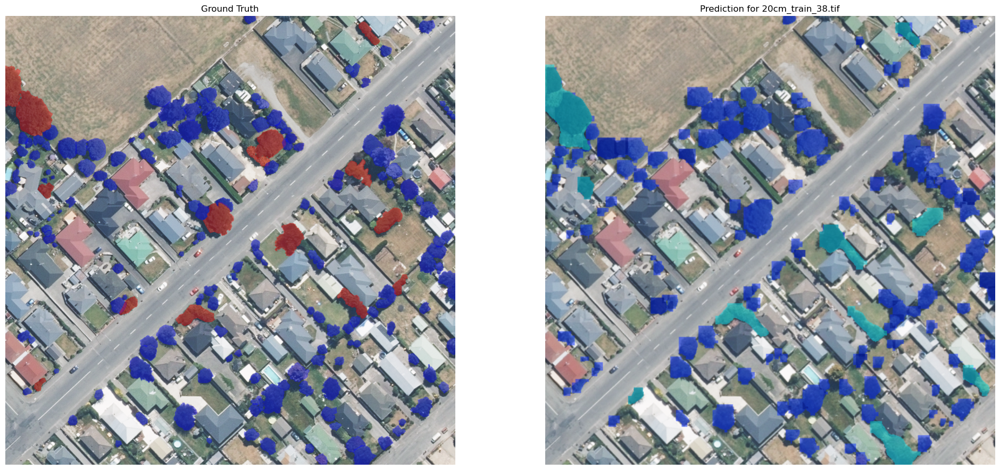


image 1/1 C:\Users\hmanasi1\Documents\ADML\solafune_tree_canopy\notebooks\..\data\processed\images\val\40cm_train_77.tif: 640x640 51 individual_trees, 5 group_of_treess, 139.1ms
Speed: 8.9ms preprocess, 139.1ms inference, 25.2ms postprocess per image at shape (1, 3, 640, 640)


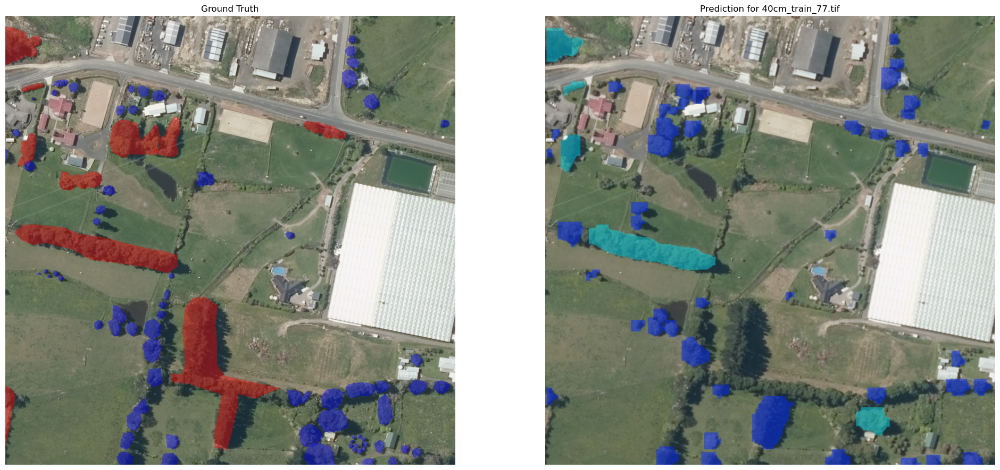


image 1/1 C:\Users\hmanasi1\Documents\ADML\solafune_tree_canopy\notebooks\..\data\processed\images\val\60cm_train_104.tif: 640x640 270 individual_trees, 27 group_of_treess, 298.7ms
Speed: 7.5ms preprocess, 298.7ms inference, 796.6ms postprocess per image at shape (1, 3, 640, 640)


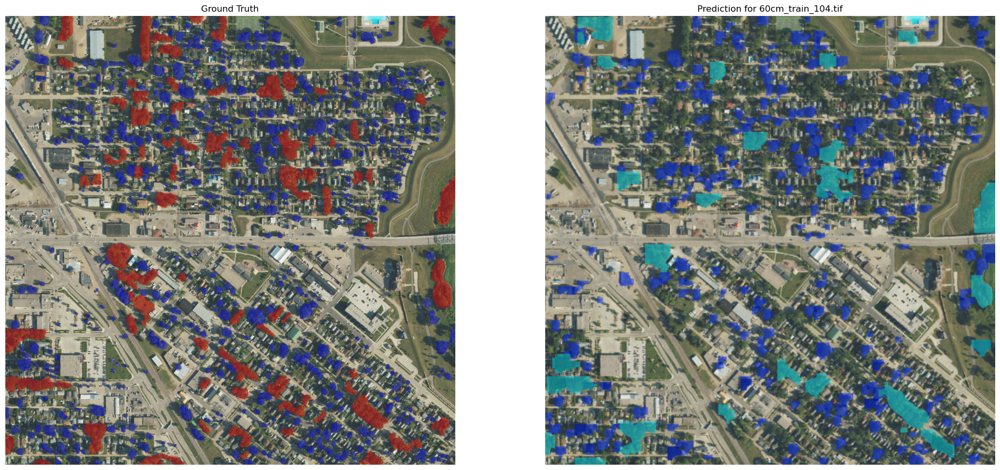


image 1/1 C:\Users\hmanasi1\Documents\ADML\solafune_tree_canopy\notebooks\..\data\processed\images\val\80cm_train_130.tif: 640x640 23 individual_trees, 6 group_of_treess, 143.5ms
Speed: 6.3ms preprocess, 143.5ms inference, 15.4ms postprocess per image at shape (1, 3, 640, 640)


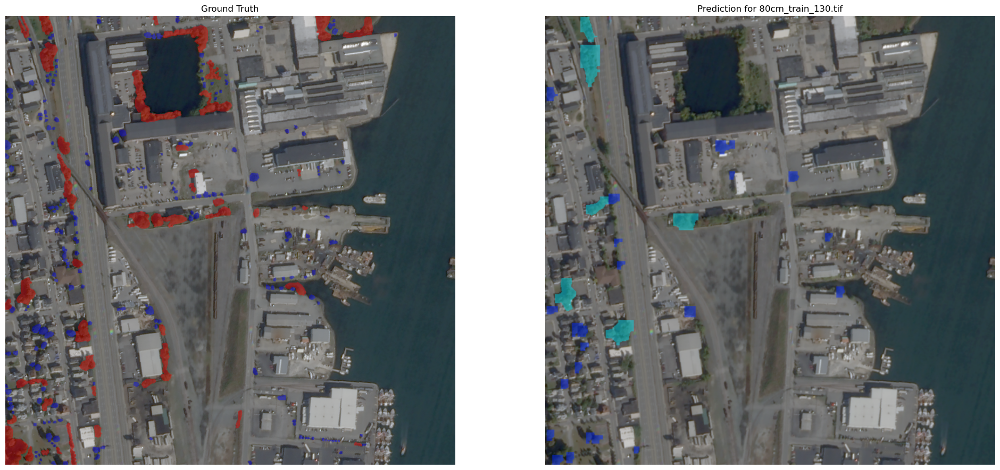

In [27]:
# Select one image for each resolution
val_images = list(VAL_IMAGES_DIR.glob('*.tif'))
resolutions = ['10cm', '20cm', '40cm', '60cm', '80cm']
selected_images = []
for res in resolutions:
    for img_path in val_images:
        if img_path.name.startswith(res):
            selected_images.append(img_path)
            break
print(f"Selected images: {[p.name for p in selected_images]}")

def draw_ground_truth(image_path):
    """Draws ground truth masks on an image."""
    label_path = Path(str(image_path).replace('images', 'labels').replace('.tif', '.txt'))
    
    # Copy label file to a temporary location to read it
    temp_label_path = Path('./temp_label.txt')
    if not label_path.exists():
        # If label does not exist, return original image
        return cv2.imread(str(image_path))
    shutil.copy(label_path, temp_label_path)

    image = cv2.imread(str(image_path))
    h, w, _ = image.shape

    with open(temp_label_path, 'r') as f:
        lines = f.readlines()

    # Colors for the two classes (individual_tree, group_of_trees)
    colors = [(255, 0, 0), (0, 0, 255)] 

    for line in lines:
        parts = line.strip().split()
        class_id = int(parts[0])
        points = np.array([float(p) for p in parts[1:]]).reshape(-1, 2)
        points[:, 0] *= w
        points[:, 1] *= h
        points = points.astype(int)
        
        overlay = image.copy()
        cv2.fillPoly(overlay, [points], colors[class_id])
        alpha = 0.4 
        image = cv2.addWeighted(overlay, alpha, image, 1 - alpha, 0)

    # Clean up the temporary file
    os.remove(temp_label_path)
    
    return image

def plot_comparison(image_path, model):
    """Plots a side-by-side comparison of ground truth and prediction."""
    gt_image = draw_ground_truth(image_path)
    
    results = model.predict(source=image_path, conf=0.25)
    pred_image = results[0].plot(boxes=False, labels=False)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 12))
    
    ax1.imshow(cv2.cvtColor(gt_image, cv2.COLOR_BGR2RGB))
    ax1.set_title('Ground Truth')
    ax1.axis('off')
    
    ax2.imshow(cv2.cvtColor(pred_image, cv2.COLOR_BGR2RGB))
    ax2.set_title(f'Prediction for {image_path.name}')
    ax2.axis('off')
    
    plt.show()

for img_path in selected_images:
    plot_comparison(img_path, model)

## 4. Quantitative Analysis

### 4.1. Overall Model Evaluation

Evaluate the model on the entire validation set.

In [28]:
metrics = model.val(data=str(DATA_CONFIG_PATH))
print("Overall Metrics:")
print(f"Box mAP50-95: {metrics.box.map}")
print(f"Mask mAP50-95: {metrics.seg.map}")

Ultralytics 8.3.185  Python-3.11.14 torch-2.0.1+cu117 CUDA:0 (NVIDIA RTX A2000 12GB, 12281MiB)
val: Fast image access  (ping: 0.10.0 ms, read: 1287.896.3 MB/s, size: 3072.3 KB)


val: Scanning C:\Users\hmanasi1\Documents\ADML\solafune_tree_canopy\data\processed\labels\val.cache... 30 images, 0 bac
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validati

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validation plots to first 50 items per image for speed...
WARNING Limiting validati

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all         30       7960      0.461      0.308      0.334      0.171      0.426      0.282      0.302      0.141
       individual_tree         30       7104      0.559      0.399      0.452      0.238      0.483      0.344      0.388      0.186
        group_of_trees         26        856      0.363      0.217      0.216      0.104      0.369       0.22      0.216     0.0954
Speed: 3.9ms preprocess, 30.8ms inference, 0.0ms loss, 10.4ms postprocess per image
Results saved to C:\Users\hmanasi1\Documents\ADML\Project\runs\segment\val6
Overall Metrics:
Box mAP50-95: 0.1712175440570864
Mask mAP50-95: 0.14065369832958502


## 5. Conclusion

This notebook provided a comprehensive evaluation of the `yolo11m` model. The qualitative analysis showed the model's ability to segment tree canopies in various images. The quantitative analysis provided a baseline for the model's performance, both overall and on synthetically generated 'urban' and 'rural' domains. For a more accurate domain-specific evaluation, the exact domain for each image would be required.